# Prediction and Analysis of Crabs' Age and Sex Base on Physical Features

Author: Kaijie Zhang

Course Project, UC Irvine, Math 10, S23

## Questions to help Chris and Jinghao

(We will remove this section if you want your project posted on the course notes.)

The course [project's instructions](https://christopherdavisuci.github.io/UCI-Math-10-S23/Proj/CourseProject.html) are posted in the course notes.

* What is your Student ID number?

72599636

* Would you like your project posted in the course notes?  (Posting your project is optional. This might make the project easier to share if you are applying for an internship, for example.  Feel free to include additional pieces above if you want, such as your email address or a link to your homepage or GitHub repository, if you have one.)

Yes

* If a lot of your knowledge of Python comes from somewhere outside of Math 10 (e.g., you took another Python class before), tell me a little about that.  (This way, if your project looks significantly different from what we learned in Math 10, this explanation will help me understand why.)

I believe I did not use too much techiniques leanred from the outside. Some extra points in past Math 10 courses & extra topics (such as K-Nearest Neighbors and K-Means Clustering) enlighted me so I did not apply too much (but some) unfamiliar new knowlegde.

## Introduction

Based on daily experiences, distinguishing between male and female crabs is crucial. Gender dictates a crab's role in the market; for instance, female crabs are often used to produce crab roe due to their higher roe content. However, identifying a crab's sex requires experience, especially for non-industrial fishermen. It is said that seasoned fishermen can estimate a crab's gender by evaluating its weight and size. I intend to start with the age of the crabs: using a regressor to predict the crabs' age based on available data. Subsequently, I will attempt to develop a machine learning model that aids fishermen in accurately determining the sex of crabs and assess its efficacy.

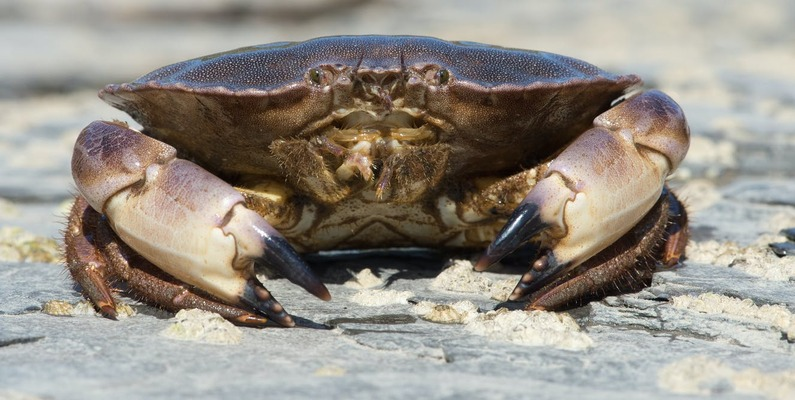

In [1]:
from PIL import Image
Image.open("dataset-cover.jpeg")

## Section 1: Data Cleaning and Feature Engineering

In [2]:
import pandas as pd
import numpy as np
import altair as alt
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
import seaborn as sns
from itertools import product
from pandas.api.types import is_numeric_dtype
from sklearn.neighbors import KNeighborsRegressor, KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.cluster import KMeans

In [3]:
df = pd.read_csv("Crab_Features.csv")

Have a short preview of the dataset:

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200000 entries, 0 to 199999
Data columns (total 10 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   id              200000 non-null  int64  
 1   Sex             200000 non-null  object 
 2   Length          200000 non-null  float64
 3   Diameter        200000 non-null  float64
 4   Height          200000 non-null  float64
 5   Weight          200000 non-null  float64
 6   Shucked Weight  200000 non-null  float64
 7   Viscera Weight  200000 non-null  float64
 8   Shell Weight    200000 non-null  float64
 9   Age             200000 non-null  float64
dtypes: float64(8), int64(1), object(1)
memory usage: 15.3+ MB


Since the original dataset is so large that Deepnote could not process all of them. I pick the first 5000 data sample to be our investigated dataset.

In [5]:
df=df[:5000]
df.dropna(inplace=True)
df.shape

(5000, 10)

Original dataset gives multiple plain but key variables. We can create our own features base on them:

In [6]:
df['Volume'] = df['Length'] * df['Diameter'] * df['Height'];
# Crab BMI
    
# Water Loss during experiment
df["water_loss"]=df["Weight"]-df["Shucked Weight"]-df['Viscera Weight']-df['Shell Weight']
df["water_loss"]=np.where( df["water_loss"]<0,
                            min(df["Shucked Weight"].min(), 
                            df["Viscera Weight"].min(), df["Shell Weight"].min()),
                            df["water_loss"]);               
# Crab density approx
df['Density'] = df['Weight']/(df['Volume']);

# Normalize weights to represent them as a ratio of the total weight
df['Shucked Weight Ratio'] = df['Shucked Weight'] / df['Weight'];
df['Shell Weight Ratio'] = df['Shell Weight'] / df['Weight'];
df['Viscera Weight Ratio'] = df['Viscera Weight'] / df['Weight'];
df['water_loss Ratio'] = df['water_loss'] / df['Weight'];

df['Sex_num'] = df['Sex'].replace({'I': 0, 'M': 1, 'F': 2});


**Volume & Density**: more familiar variables to replace height, length, and diameter. It will be a little confused if we use three variables to represent the "size" of the crabs.

This is the relation between volume and weight (in the below plot by Seaborn), which is obviousily linear according to its regression line. Such combanation of various variables could help us review the whoe dataset more effectively. (We can see there is an outlier at about (29,3.45))

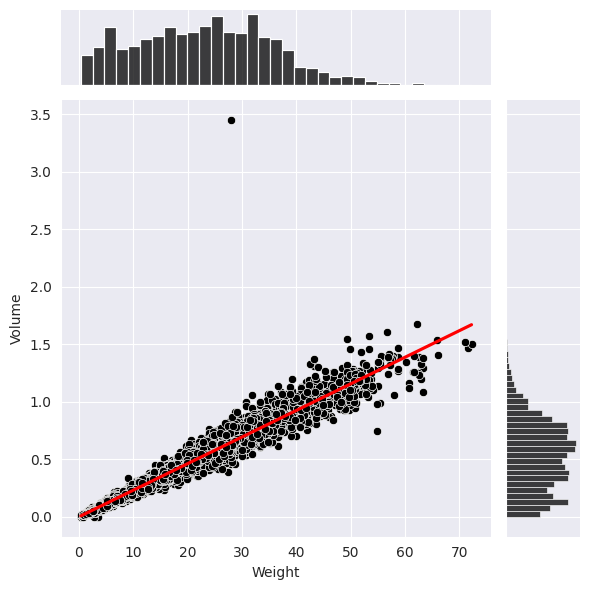

In [7]:
with sns.axes_style('darkgrid'):
    # Create jointplot without regression line
    joint = sns.jointplot(data=df, x='Weight', y='Volume', color='black')
    # Add the regression line separately
    joint.ax_joint.clear()  # Clear the original points
    sns.scatterplot(data=df, x='Weight', y='Volume', ax=joint.ax_joint, color='black')
    sns.regplot(data=df, x='Weight', y='Volume', ax=joint.ax_joint, color='red', scatter=False)

**Shucked/Viscera/Shell Weight ratio**: the ratio of sections of each individual might implies more than just posting the weight of them respectively. [It will be used later to explain the water_loss]

**water_loss**: We observe that the addition of **Shucked/Viscera/Shell Weight** does not equal to the original weight of the individual. One significant reason is that the water contained in alive crabs will outflow when researchers are decomposing the crabs. The significant part of lost weight equals to the weight of water loss. (As you can see, water loss is actually visible in total weight [by ratio])

In [8]:
# Melt the DataFrame to long format
df_melt = df.copy().melt(id_vars='Age', value_vars=['Shucked Weight Ratio', 'Shell Weight Ratio', 'Viscera Weight Ratio', 'water_loss Ratio'], var_name='Weight Type', value_name='Weight Ratio')

# Due to the deepnote has a limitation of 5000 rows for dataframe, we'll aggregate data by taking mean of the ratios for each Age.
df_agg = df_melt.groupby(['Age', 'Weight Type']).mean().reset_index()

# Create the stacked bar chart
chart = alt.Chart(df_agg).mark_bar().encode(
    x='Age:O',
    y=alt.Y('Weight Ratio:Q', stack='normalize'),
    color='Weight Type:N',
    tooltip = ['Weight Ratio:Q']
).properties(
    title="Ratio of Crabs' Weight")

chart

alt.Chart(...)

id is not related to our prediction, so I drop it to avoid any mistakes.

In [9]:
df.drop("id", axis=1)

,Sex,Length,Diameter,Height,Weight,Shucked Weight,Viscera Weight,Shell Weight,Age,Volume,water_loss,Density,Shucked Weight Ratio,Shell Weight Ratio,Viscera Weight Ratio,water_loss Ratio,Sex_num
0,M,1.5750,1.2250,0.3750,31.226974,12.303683,6.321938,9.638830,10.0,0.723516,2.962523,43.160055,0.394008,0.308670,0.202451,0.094871,1
1,I,1.2375,1.0000,0.3750,21.885814,7.654365,3.798833,7.654365,19.0,0.464063,2.778251,47.161350,0.349741,0.349741,0.173575,0.126943,0
2,F,1.4500,1.1625,0.4125,28.250277,11.127179,7.016501,7.257472,11.0,0.695320,2.849125,40.629155,0.393879,0.256899,0.248369,0.100853,2
3,I,1.3500,1.0250,0.3750,21.588144,9.738053,4.110678,6.378637,9.0,0.518906,1.360776,41.603169,0.451083,0.295469,0.190414,0.063033,0
4,I,1.1375,0.8750,0.2875,14.968536,5.953395,2.962523,3.713785,8.0,0.286152,2.338834,52.309675,0.397727,0.248106,0.197917,0.156250,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,M,1.6750,1.2750,0.5000,37.407165,14.855138,7.002326,11.906790,14.0,1.067813,3.642911,35.031586,0.397120,0.318302,0.187192,0.097385,1
4996,M,1.6000,1.2000,0.4375,31.397071,14.047177,7.016501,8.930093,10.0,0.840000,1.403300,37.377466,0.447404,0.284424,0.223476,0.044695,1
4997,M,1.6000,1.2750,0.4375,36.273185,15.521351,9.270286,10.404267,10.0,0.892500,1.077281,40.642224,0.427902,0.286831,0.255569,0.029699,1
4998,F,1.3625,1.0375,0.3375,21.559795,9.128539,4.479221,7.087375,10.0,0.477088,0.864660,45.190404,0.423406,0.328731,0.207758,0.040105,2


In [10]:
df.columns #Preview all current variables in the dataset:

Index(['id', 'Sex', 'Length', 'Diameter', 'Height', 'Weight', 'Shucked Weight',
       'Viscera Weight', 'Shell Weight', 'Age', 'Volume', 'water_loss',
       'Density', 'Shucked Weight Ratio', 'Shell Weight Ratio',
       'Viscera Weight Ratio', 'water_loss Ratio', 'Sex_num'],
      dtype='object')

Since Sex is the only String variable in the dataset, I prefer to separate that into three Boolean variables: Male, Female, and Indeterminate.

In [11]:
df_num = pd.get_dummies(df, columns=['Sex'])

Let see whether all columns in df_num are currently numeric:

In [12]:
len([c for c in df_num.columns if is_numeric_dtype(df_num[c])]) == df_num.shape[1]

True

In [13]:
df_num.sample(3)

,id,Length,Diameter,Height,Weight,Shucked Weight,Viscera Weight,Shell Weight,Age,Volume,water_loss,Density,Shucked Weight Ratio,Shell Weight Ratio,Viscera Weight Ratio,water_loss Ratio,Sex_num,Sex_F,Sex_I,Sex_M
2610,2610,1.3125,1.0250,0.3375,19.745427,8.604073,3.883882,5.811648,10.0,0.454043,1.445824,43.488013,0.435750,0.294329,0.196698,0.073223,0,0,1,0
2519,2519,0.9875,0.7625,0.2625,9.794752,4.521745,2.253785,2.693202,7.0,0.197654,0.326019,49.554967,0.461650,0.274964,0.230101,0.033285,0,0,1,0
573,573,1.0875,0.8625,0.2875,11.141353,6.605434,1.984465,3.118445,7.0,0.269666,0.085048,41.315378,0.592875,0.279898,0.178117,0.007634,0,0,1,0


## Section 2: Regressor - Age Prediction

A basic view of distribution of popuation in different age. We could see the majority of population locate in range from 7 yrs to 11 yrs.

In [14]:
alt.Chart(df).mark_bar().encode(
    x = alt.X("Age", bin=alt.Bin(maxbins=100)),
    y="count()"
).properties(
    title="Distribution of Age")

alt.Chart(...)

First,before predicting the sex, I want to use regressor to predict the age according to crab's weight by connecting PolynomialFeatures and LinearRegression model by Pipeline so that we can see different regression lines with different degrees.

In [15]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression

The first stage uses the PolynomialFeatures class from sklearn.preprocessing to transform the original variable 'Weight' into polynomial features of a 
specified degree d. The argument include_bias=False ensures that a column of ones (the bias or intercept) is not added to the polynomial features. The second stage uses the LinearRegression class from sklearn.linear_model to perform linear regression on the transformed data.

In [16]:
def poly_fit(df,d,color):
    df_sub = df.copy()
    X = df_sub[["Weight"]]
    y = df_sub["Age"]
    pipe = Pipeline(
    [
        ("poly", PolynomialFeatures(degree=d, include_bias=False)), 
        ("reg", LinearRegression())
    ]
    )
    pipe.fit(X,y)
    df_sub[f"pred{d}"] = pipe.predict(df_sub[["Weight"]])
    chart = alt.Chart(df_sub).mark_line(clip=True, color=color).encode(
        x=alt.X("Weight", scale=alt.Scale(domain=(0,80))),
        y=alt.Y(f"pred{d}", scale=alt.Scale(domain=(0,28))),
    )
    return chart

In [17]:
chartl = alt.Chart(df).mark_circle().encode(
        x="Weight",
        y="Age"
    )

I choose three representative degrees number: 1,2,8. Overly high degrees will cause overfitting to each data point, which makes the plot looks messy.

In [18]:
state_colors = [(1, 'red'), (2, 'blue'), (8, 'green')]
chart_list = [poly_fit(df,d,color) for d, color in state_colors]

We can observe that regression line in different degrees implies how many curves it might have: a staright line for 1 degrees, 2 curves for 2 degrees, and multiple curves for 8 degrees. But all of them could explain the positive relationship between weight and age (it could be slightly negative when crabs are old).

In [19]:
chartl+chart_list[0]+chart_list[1]+chart_list[2]

alt.LayerChart(...)

We can observe that when the number data points decrease (and their distribution becomes more discrete), the up and down fluctuation of the regression line becomes very exaggerated. It might be because a small data points could lead to an ovefitting.

In [20]:
cols0 = ["Length","Diameter","Height","Weight"]
X_train0, X_test0, y_train0, y_test0 = train_test_split(df[cols0], df["Age"], test_size = 0.3)

Now, I want to use K-Nearest Neighbors. We want to check how k values impact the error of prediction of age by multiple features. The "k" in K-Nearest Neighbors Regressor represents the number of nearest neighbors to consider when making a prediction for a new instance.

In [21]:
reg = KNeighborsRegressor(n_neighbors=10)
reg.fit(X_train0, y_train0)

KNeighborsRegressor(n_neighbors=10)

In [22]:
def get_scores(k):
    reg = KNeighborsRegressor(n_neighbors=k)
    reg.fit(X_train0, y_train0)
    train_error = mean_absolute_error(reg.predict(X_train0), y_train0)
    test_error = mean_absolute_error(reg.predict(X_test0), y_test0)
    return (train_error, test_error)
df_scores = pd.DataFrame({"k":range(1,150),"train_error":np.nan,"test_error":np.nan})
df_scores.head()

,k,train_error,test_error
0,1,NaN,NaN
1,2,NaN,NaN
2,3,NaN,NaN
3,4,NaN,NaN
4,5,NaN,NaN


In [23]:
for i in df_scores.index:
    df_scores.loc[i,["train_error","test_error"]] = get_scores(df_scores.loc[i,"k"])
df_scores

,k,train_error,test_error
0,1,0.006857,2.220667
1,2,1.130857,2.017667
2,3,1.369810,1.914667
3,4,1.472143,1.839333
4,5,1.527657,1.813067
...,...,...,...
144,145,1.784382,1.715439
145,146,1.784961,1.715594
146,147,1.785563,1.715746
147,148,1.784958,1.715811


If "k" is too small, the model may be overly sensitive to noise in the data. If "k" is too large, then the model may include points that are too far away from the query point, which could result in predictions that are less relevant or accurate. This phenomenon is also applied for other datasets.

In [24]:
df_scores["k_value"] = 1/df_scores.k
ctrain = alt.Chart(df_scores).mark_line().encode(
    x = "k_value",
    y = "train_error"
)
ctest = alt.Chart(df_scores).mark_line(color="orange").encode(
    x = "k_value",
    y = "test_error"
)
alt.layer(ctrain,ctest)

alt.LayerChart(...)

## Section 2.5: Classifier - Distribution of Crabs' Sex

Deleting outliers to make the plot make more sense.

In [25]:
df = df[df["Density"]<=120]

You can click the below bottom to see the distribution of each Sex respectively:

In [26]:
Sex_features = df["Sex"].unique()
Sex_radio = alt.binding_radio(options=Sex_features)
Sex_select = alt.selection_single(
    fields=["Sex"], bind=Sex_radio, name="Select to see the distribution for each sex:(Male,Indeterminate,Female) "
)
Sex_color_condition = alt.condition(
    Sex_select,
    alt.Color("Sex:N", legend=None),
    alt.value("lightgray"),
)

Sex_distribution = alt.Chart(df).mark_point(filled=True).encode(
    x=alt.X("Volume", scale=alt.Scale(domain=(0,1.8))),
    y=alt.Y("Density", scale=alt.Scale(domain=(20,120))),
    color="Sex:N",
    tooltip = ["Sex","Volume","Density"]
).add_selection(Sex_select).encode(color=Sex_color_condition).properties(
    title="Use the radio button to filter the scatter plot")
Sex_distribution

alt.Chart(...)

In [27]:
pic_sex = Image.open("Sex_Crab_eg.png")

According to above graph of the distribution of Density&Volume of crabs with different sex,
we can tell when volume is a relatively a lower range, researchers will be more likely 
to indentify the crab with an indeterminated sex. Maybe it means the helpful features to tell which 
crabs are male or female is not obvious enough when the crabs are small (You can see in the below document, helpful features are required for classification).

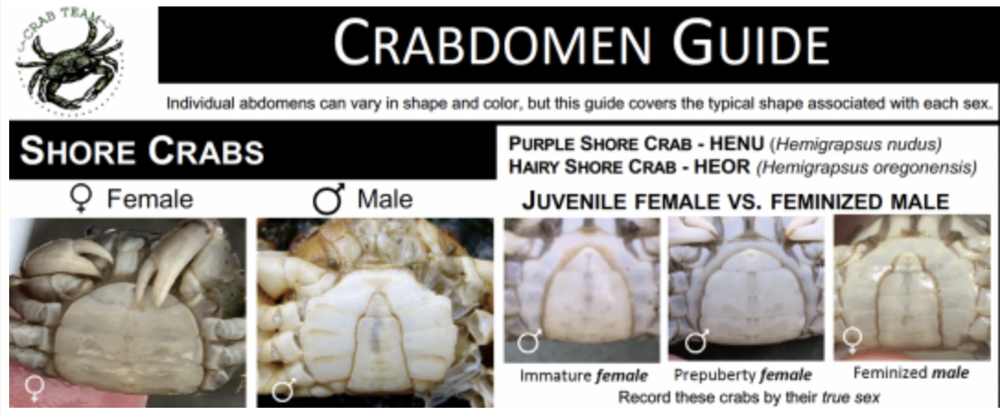

In [28]:
pic_sex

Now, I want to see how K-Means Clustering works to group the sex.

In [29]:
colsS = ["Volume","Sex_num","Density","Sex"]
X_trainS = df[colsS][:2500]
X_testS = df[colsS][2500:]
kmeans = KMeans(n_clusters=3)
kmeans.fit(X_trainS[["Volume","Density"]])

KMeans(n_clusters=3)

In [30]:
kmeans.cluster_centers_

array([[ 0.62243238, 40.01009396],
       [ 0.22131407, 58.90581846],
       [ 0.49609896, 46.86210424]])

Mark the centers as Triangles. We can see it does not well applied to this data when we are looking for grouping of Sex depending on the mean of volume and density.

We apply the previous centers to new dataset. We can see obviously both of them are grouped in same way:

In [31]:
arr = kmeans.predict(X_trainS[["Volume","Density"]])
X_trainS["cluster"] = arr
X_trainS['cluster'] = X_trainS['cluster'].replace({1: 0, 2: 1, 0: 2})
cen0 = alt.Chart(X_trainS).mark_circle().encode(
    x=alt.X("Volume", scale=alt.Scale(zero=False)),
    y=alt.Y("Density", scale=alt.Scale(zero=False)),
    tooltip = ["Sex"],
    color="cluster:N"
)

df_center = pd.DataFrame(kmeans.cluster_centers_, columns=['ColumnX', 'ColumnY'])

cen2 = alt.Chart(df_center).mark_point(color = "black",shape='triangle',size=80).encode(
    x = 'ColumnX',
    y = 'ColumnY',
    tooltip = ['ColumnX','ColumnY']
)
alt.layer(cen0+cen2)

alt.LayerChart(...)

Check whether the clusters base on training dataset is entirely the same with the crab's sex:

In [32]:
lst = X_trainS['cluster'] == X_trainS["Sex_num"]
# Convert the list to a pandas Series
# Check whether any value is Boolean False
contains_false = pd.Series(lst).isin([False]).any()
contains_false

True

true. It means the grouping is different from the actual one (It is easy to observe by our eyes)

In [33]:
kmeans.cluster_centers_

array([[ 0.62243238, 40.01009396],
       [ 0.22131407, 58.90581846],
       [ 0.49609896, 46.86210424]])

In [34]:
arr_new = kmeans.predict(X_testS[["Volume","Density"]])
X_testS["cluster_new"] = arr_new
X_testS['cluster_new'] = X_testS['cluster_new'].replace({1: 0, 2: 1, 0: 2})
cen1 = alt.Chart(X_testS).mark_circle().encode(
    x=alt.X("Volume", scale=alt.Scale(zero=False)),
    y=alt.Y("Density", scale=alt.Scale(zero=False)),
    tooltip = ["Sex"],
    color="cluster_new:N"
)
alt.layer(cen1+cen2)

alt.LayerChart(...)

Same for the new dataset:

In [35]:
lst_new = X_testS['cluster_new'] == X_testS["Sex_num"]
# Convert the list to a pandas Series
# Check whether any value is Boolean False
contains_false_new = pd.Series(lst_new).isin([False]).any()
contains_false_new

True

Then, use random forest classifier. But I would like to fit the model with less features first:

In [36]:
cols1 = ["Volume","Density"]
X_train1, X_test1, y_train1, y_test1 = train_test_split(df[cols1], df["Sex"], test_size=0.3)

In [37]:
clf1= DecisionTreeClassifier(max_leaf_nodes=5)
clf1.fit(X_train1, y_train1)

DecisionTreeClassifier(max_leaf_nodes=5)

In [38]:
clf1.classes_

array(['F', 'I', 'M'], dtype=object)

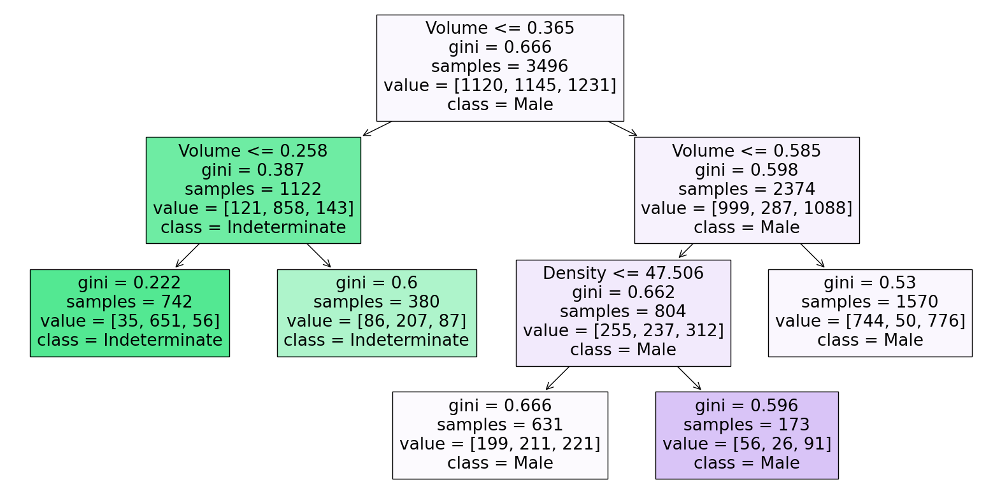

In [39]:
fig = plt.figure(figsize=(20,10))
_ = plot_tree(clf1, 
                feature_names=clf1.feature_names_in_,
                class_names=["Female", "Indeterminate","Male"],
                filled=True)

In [40]:
xx = np.linspace(0,2,70)
yy = np.linspace(0,0.7,70)
df_art = pd.DataFrame(list(product(xx,yy)), columns=cols1)
df_temp = df_art.copy()
df_temp["pred"] = clf1.predict_proba(df_temp)[:, 1] #So we are looking for "Indeterminate"
color_spec = alt.Color("pred:Q", scale=alt.Scale(scheme="blueorange"))
alt.Chart(df_temp).mark_circle().encode(
    x="Volume",
    y="Density",
    color=color_spec,
    tooltip=["Volume", "Density", "pred"] 
).properties(
    title="True values"
).configure_axis(
    grid=False
)

alt.Chart(...)

In [41]:
clf1.score(X_test1,y_test1)

0.5650433622414943

## Section 3: Classifier - Crab's Sex Prediction

View which features might significantly affect the probability of one particular sex by heatmap.

<AxesSubplot:>

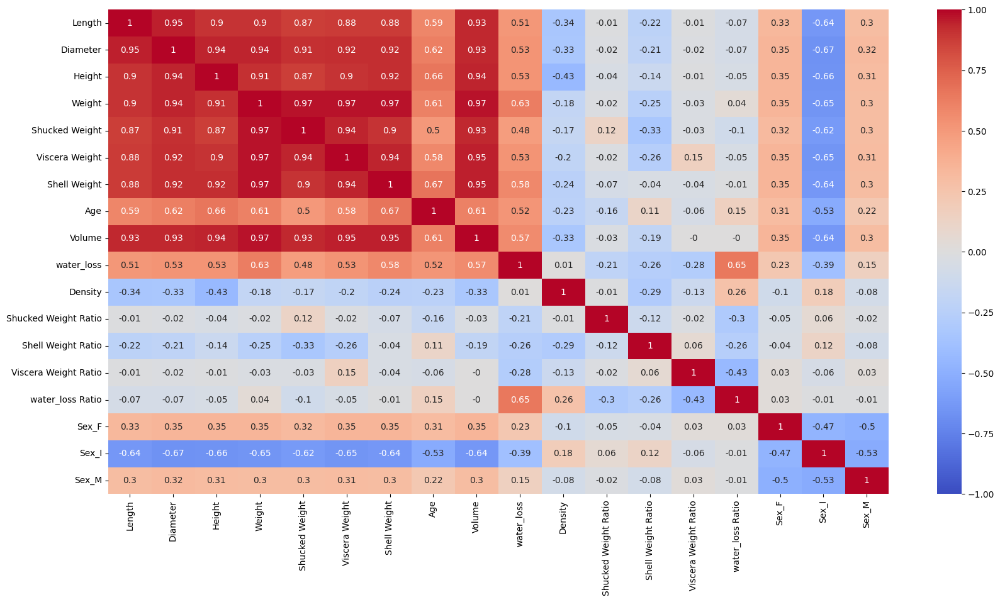

In [42]:
corr = df_num.drop(columns=['id','Sex_num']).corr().round(2)
plt.figure(figsize=(20,10))
sns.heatmap(corr, vmin=-1, vmax=1, center=0, square=False, annot=True, cmap='coolwarm')

In [44]:
cols2 = ['Length', 'Diameter', 'Height', 'Weight',
 'Shucked Weight','Viscera Weight', 'Shell Weight',"Age"]
X_train2, X_test2, y_train2, y_test2 = train_test_split(df[cols2], df["Sex"], test_size=0.3)

In [45]:
clf2 = DecisionTreeClassifier(max_leaf_nodes=18)
clf2.fit(X_train2, y_train2)

DecisionTreeClassifier(max_leaf_nodes=18)

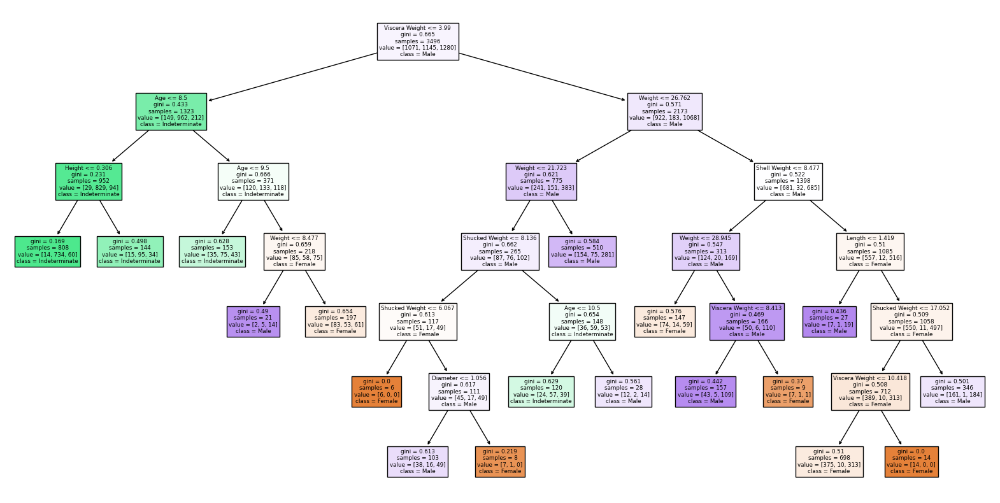

In [46]:
fig = plt.figure(figsize=(20,10))
_ = plot_tree(clf2, 
                feature_names=clf2.feature_names_in_,
                class_names=["Female", "Indeterminate","Male"],
                filled=True)

Unfortunately， using more features could not significantly improve the accurarcy of classification. Though I have tried to prevent overfitting by control the numbers of max leaf and depth of the tree.

In [47]:
clf2.score(X_test2,y_test2)

0.5823882588392262

## Conclusion

In this project, we have mainly tried to use a series of characteristics of crabs to train machine learning models, aiming to predict the gender of crabs as accurately as possible. It's regrettable that our final prediction accuracy is just over 50%, or around 10% more than half. However, this is also related to the limitations of the database. Since this database primarily provides numerical parameters, and in reality, most people rely on unique organs to distinguish the sex of crabs (hence, training an image recognition model might be more accurate), the existing numerical data alone is not comprehensive enough.

## Summary

After previewing the dataset and features engineering, I start with the prediction of the age of the crabs: using a regressor to predict the crabs' age based on available data. After that, I develop two similar machine learning model by random forest classifier that aids fishermen in accurately determining the sex of crabs and assess its efficacy. However, the result does not support a more effecient outcome. During the investigation, I also use K-Nearest Neighbors and K-Means Clustering as some of the extension (but not limit to, e.g, seaborn).

## References

Your code above should include references.  Here is some additional space for references.

* What is the source of your dataset(s)?

https://www.kaggle.com/datasets/sidhus/crab-age-prediction

* List any other references that you found helpful.

https://wsg.washington.edu/crabteam-malevsfemale/

https://towardsdatascience.com/how-to-create-bindings-and-conditions-between-multiple-plots-using-altair-4e4fe907de37

https://jakevdp.github.io/PythonDataScienceHandbook/04.14-visualization-with-seaborn.html

## Submission

Using the Share button at the top right, **enable Comment privileges** for anyone with a link to the project. Then submit that link on Canvas.

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=c07a03d9-13de-4c11-879b-83e80c2aaa59' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>